In [22]:
#basic importing
import os
import sys
path1=sys.path.append('/u/vasulkar/p_emodnet_amey/Regional_canada_model/')
from IPython.display import Image
from IPython.core.display import HTML 
# Image("sea_ice_division.jpg")

# Introduction
The sea ice cover is divided in three parts.

<!-- ![title](sea_ice_division.jpg) -->
<img src="sea_ice_division.jpg" width="900"/>


Assuming the drifting sea ice and water as one integrated layer. The momentum equatio for the integrated layer is given by:
$$\frac{\partial u}{\partial t}+f\times u +\frac{(u. \partial)u}{h}=-g\nabla(\zeta)+\nabla.(\tilde{\nu}(\nabla u + \nabla u^T))+\frac{\rho_w \tilde{C_w}u|u|}{h}+\frac{\tau_{IT}}{h}, $$
where $\tilde{\nu}$ is the effective viscosity of the ice-ocean layer and $\tilde{C_w}=C_w+C_i$ with $C_w$ being the bottom friction coefficient and $C_i$ is the drag coefficient between fast ice and ocean. 
 
The idea is to optimize the effective viscosity parameter in the region of the sea ice cover. Now, we can only have a certain number of parameters so the region of sea ice cover has to be discretized and each point in the discretized domain acts as a parameter. But this is not possible realistically as we will have a lot of parameters than observations. So, the idea here is to analyse the domain and use physics to determine how the sea ice cover can be divided. The division of the sea ice cover will give us the number of parameters and their distribution. For this, we use the energy loss from the viscous shear as a parameter to judge in the domain where the energy loss to viscous shear is high and important. 


# Smagorinsky Model
For this, in dflowfm there is not direct way to compute the viscous shear. So we impose aa smagorinsky turbulence model in the computations.
The model states that the residual viscous shear to close the N-S equations is given by:
$$\tau^r=-2\nu_r \bar{S},$$
where $\nu_r$ is the residual effective viscosity and $\bar{S}$ is the Strain Rate. Now in DFlow-FM the effective viscosity map is available and it is computed as:
$$\nu_r=\nu_i+((C_sdx)^2)\bar{S},$$
where $\nu_i(=25)$ is the initial viscosity used in our model, $C_s$ is the Smagorinsky coefficient, $dx$ is the grid step. 

Now, the viscous shear stress is given by:
$$\tau_v=2\nu \partial S. $$
Then, assumeing $C_s=1$, we can use the viscosity output ($\nu_r$) from the model to compute the partial derivative of shear strain as:
$$\bar{S}dx^2=\nu_r-\nu$$

Based on the above analysis, it seems difficult to use the idea. but just plotting the residual viscosity can give some idea for creating boxes. Also, for now in september there is already
less sea ice and that sea ice is located way towards the north. so we can get away with the small square boxes we had before as we might barely have 5-6 boxes.

The next step is to get points from the fibonacci grid in the sea ice cover for 2020 september. Then we create a viscosity value for those points in .xyz format. then we create parameter blocks in the region to multiply on top of that viscosity value/ 

In [23]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, MultiPolygon, shape
import shapefile

import cartopy.crs as ccrs
import cartopy.feature as cpf 
from global_land_mask import globe
import pandas as pd
import os
import pyproj
from osgeo import ogr
from osgeo import gdal
import fiona
from shapely.geometry import shape,mapping, Point, Polygon, MultiPolygon
gdal.UseExceptions()
from pyproj import Proj, transform
from cartopy.feature import ShapelyFeature
import cmocean

First Step is to get the fibonacci points in our model domain.

In [24]:
fname='modelpoints_fb.xyz'
headerlist=['Lon','Lat','pname']
df=pd.read_csv(fname,names=headerlist,delim_whitespace=True)
df.head()
modoceanlonpointvec=np.array(df['Lon'])
modoceanlatpointvec=np.array(df['Lat'])

Now we check which points lie in sea ice cover. For this purpose, right now we use the nsidc data of sea ice cover etc and compue the tc_mid and fast from that. We process that separately, locally due to issue in library installation on p drive. can be found at Research Data-ice-friction-analysis-nsidc2020. The processed files are found in folder with names as *nh20130311* in NSIDC data folder.

/tmp/ipykernel_21690/1475259763.py:12: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  multi= multipol.next() # only one feature in the shapefile


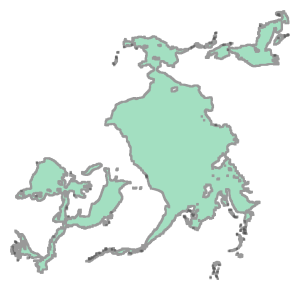

In [25]:
#get the projected buff file which gives us the polygon on ice cover. 
#now depending on march and september we have different files. Also, for march we will have the friction term too.
month='march'
# prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer_proj.shp'
# buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer.shp'
buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/tc_mid/Buffer.shp'
prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/tc_mid/Buffer_proj.shp'
# reader=shapefile.Reader(buffile)
# multipol=shape(reader.shape())
multipol = fiona.open(buffile)
multipolprj=fiona.open(prjbuffile)
multi= multipol.next() # only one feature in the shapefile
multipol=shape(multi['geometry'])
multipol

In [26]:
#check if a point lies in a polygon. If so, add the point in inicelon and inicelat 
paramid=[]
inicelon=[];inicelat=[]
count=0
inProj = Proj(init='epsg:4326', preserve_units=True)
outProj = Proj(init='epsg:6931')
for i in range(len(modoceanlatpointvec))[:]:
    x2,y2 = transform(inProj,outProj,modoceanlonpointvec[i],modoceanlatpointvec[i])
    point=shape(Point(x2,y2))
    # print(point)
    if point.within(multipol.buffer(0)):
        # print(i)
        inicelon=np.append(inicelon,modoceanlonpointvec[i])
        inicelat=np.append(inicelat,modoceanlatpointvec[i])
        count+=1

/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferre

In [6]:
# fname='vis_correction_20200919.xyz'
#  #sorting based on paramid value.
# #converting to a .xyz file
# vec=np.vstack((inicelon,inicelat))
# paramid=1.0*np.ones((len(inicelat)))
# vec=np.vstack((vec,paramid.reshape((1,len(paramid)))))
# np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.2f'],delimiter='\t')

Getting the ice thickness and ice concentration from CMEMS global ocean reanlaysis product. 
https://resources.marine.copernicus.eu/product-detail/GLOBAL_MULTIYEAR_PHY_001_030/INFORMATION

But above product was only till july 2020. so we used:

https://resources.marine.copernicus.eu/product-detail/ARCTIC_MULTIYEAR_PHY_002_003/INFORMATION

but turns out this is in polar stereographic north coordinates. :)


In [27]:
#sept
# sitfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650276570205.nc'
#march
sitfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650373925748.nc'
sitdata=xr.open_dataset(sitfile)
sitdata

<xarray.Dataset>
Dimensions:        (time: 1, x: 609, y: 845)
Coordinates:
    latitude       (y, x) float32 ...
  * x              (x) float32 -38.0 -37.88 -37.75 -37.62 ... 37.75 37.88 38.0
  * y              (y) float32 -52.75 -52.62 -52.5 -52.38 ... 52.5 52.62 52.75
  * time           (time) datetime64[ns] 2020-03-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    sithick        (time, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    version:                         v4b
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention
    comment:

In [28]:
sitlon=np.array(sitdata.longitude.values).ravel()
sitlat=np.array(sitdata.latitude.values).ravel()
sit=sitdata.sithick.values[0,:,:]
sit=sit.ravel()
sit=np.where((np.isnan(sit)==True),0,sit)
#may be smart to convert nan to 0?
# print(sit)

In [29]:
#interpolate the sit data to the points within the ice cover from NSIDC. 
#inicelon and inicelat are the vectors.
from scipy.interpolate import NearestNDInterpolator 
# #nearest interpolator is used because of a lot of nan values around. and interpolation really makes it smooth. which we don't want. 
interpfunc=NearestNDInterpolator(list(zip(sitlon,sitlat)),sit)
siti=interpfunc(inicelon,inicelat)
# siti=siti[:,0]
#above is for a 2D grid.

Now we read sea ice concentration data.

In [30]:
#sept
# sicfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650276490073.nc'
#march
sicfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650373962695.nc'
sicdata=xr.open_dataset(sicfile)
sicdata

<xarray.Dataset>
Dimensions:        (time: 1, x: 609, y: 845)
Coordinates:
    latitude       (y, x) float32 ...
  * x              (x) float32 -38.0 -37.88 -37.75 -37.62 ... 37.75 37.88 38.0
  * y              (y) float32 -52.75 -52.62 -52.5 -52.38 ... 52.5 52.62 52.75
  * time           (time) datetime64[ns] 2020-03-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    siconc         (time, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    version:                         v4b
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention
    comment:

In [31]:
siclon=np.array(sicdata.longitude.values).ravel()
siclat=np.array(sicdata.latitude.values).ravel()
sic=sicdata.siconc.values[0,:,:]
sic=np.array(sic).ravel()
sic=np.where((np.isnan(sic)==True),0,sic)
#may be smart to convert nan to 0?
# print(sic)
interpfunc=NearestNDInterpolator(list(zip(siclon,siclat)),sic)
sici=interpfunc(inicelon,inicelat)
#1d vec


Now using the sic and sit values at these point we compute the viscosity eta. And then divide that by H (bathymetry)

In [32]:
#shear and bulk viscosities of sea ice EVP and shiming yu ppt
#standard values.
def computeiceviscosity(sic,sit):
    P_s=25.
    deltao=2e-09
    e=2.
    rhoi=920.
    C=20.
    #Start by computing P
    #P=P_s*h*np.exp(-C(1-A))
    Pvec=[]
    for i in range(len(sit)):
        h=sit[i]
        A=sic[i]
        if (A>0.0) and (h>0.0):   #only using ice  concentration A>0.0 and h>0.0.
            P=P_s*h*np.exp(-C*(1-A))
            Pvec=np.append(Pvec,P)
        else:
            Pvec=np.append(Pvec,0)
    etaivec=Pvec/(2*deltao*e**2)
    etaivec=etaivec/rhoi
    return(etaivec)

etaivec=computeiceviscosity(sici,siti)

Now we divide this by bathymetry to get the depth averaged form. The bathymetry from canada model is obtained and interpolated to the ice poiints.

In [33]:
netcanda='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/snelliusmodels/basic_test_model/stochModel/input_model/gtsm__canada_2_net.nc'
netdata=xr.open_dataset(netcanda)
netdata

<xarray.Dataset>
Dimensions:      (nNetLink: 560343, nNetLinkPts: 2, nNetNode: 278376)
Coordinates:
    NetNode_x    (nNetNode) float64 ...
    NetNode_y    (nNetNode) float64 ...
Dimensions without coordinates: nNetLink, nNetLinkPts, nNetNode
Data variables:
    Mesh2D       int32 ...
    wgs84        int32 ...
    NetNode_z    (nNetNode) float64 ...
    NetLink      (nNetLink, nNetLinkPts) int32 ...
    NetLinkType  (nNetLink) int32 ...
Attributes:
    institution:    Deltares
    references:     http://www.deltares.nl
    source:         Deltares, D-Flow FM Version 1.2.59.64338M, Jul 19 2019, 1...
    history:        Created on 2021-07-21T17:40:42+0200, D-Flow FM
    date_created:   2021-07-21T17:40:42+0200
    date_modified:  2021-07-21T17:40:42+0200
    Conventions:    UGRID-0.9

In [34]:
netx=netdata.NetNode_x.values
nety=netdata.NetNode_y.values
Hbathy=netdata.NetNode_z.values
#may be better if nan values to put it to zero.
Hbathy=np.where((np.isnan(Hbathy)==True),0,Hbathy)
#we use a linear interpolator now because it is more accurate and less chances of point being on land. 
from scipy.interpolate import griddata
# interpfunc=griddata(list(zip(netx,nety)),Hbathy,list(zip(netx,nety)))
Hvec=griddata(list(zip(netx,nety)),Hbathy,list(zip(inicelon,inicelat)),method='cubic')
#nan values occur for points outside the grid. so at these points we use nearest nd interpolator.
interpfunc=NearestNDInterpolator(list(zip(netx,nety)),Hbathy,list(zip(netx,nety)))
Hvecnearest=interpfunc(inicelon,inicelat)
Hvecf=np.where(np.isnan(Hvec)==True,Hvecnearest,Hvec)


In [35]:
etai_daveraged=-etaivec/Hvecf

In [36]:
#save the viscosity value file.
fname='viscosityval_20200313.xyz'
vec=np.vstack((inicelon,inicelat))
vec=np.vstack((vec,etai_daveraged.reshape((1,len(etai_daveraged)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec[2,:]=1.0 #starting with 1.0 as the multiplier.
np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

Once we have this file. We create a parameter files for sea ice. We use the same squares we had before. but that makes it complex. so we decide to use qgis again and create polygons there.

In [37]:
#sept
# poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/ice_vis_polygon_20200917/ice_poly_v1.csv')
#march 
poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/ice_vis_polygon_20200313/ice_poly_v1.csv')

poldf.head()
poldf.id.values

array([ 4,  4,  4,  4,  4,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  8,  8,
        8,  8,  8, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 12, 12,
       12, 12, 12, 13, 13, 13, 13, 13, 19, 19, 19, 19, 19, 15, 15, 15, 15,
       15, 18, 18, 18, 18, 18, 21, 21, 21, 21, 21, 20, 20, 20, 20, 20, 22,
       22, 22, 22, 22,  5,  5,  5,  5,  5,  1,  1,  1,  1,  1, 16, 16, 16,
       16, 16, 17, 17, 17, 17, 17, 14, 14, 14, 14, 14,  9,  9,  9,  9,  9,
        2,  2,  2,  2,  2,  3,  3,  3,  3,  3])

In [38]:
Npol=22
Lonvec=poldf['X']
Latvec=np.array(poldf['Y'])
# Latvec[78]=72.0  ##it was 72.0033 changed as it is wrong in excel file
# Latvec=np.where(Latvec==84,84.5,Latvec) ##points added till 84.3
# Lonvec=np.where(Lonvec==-46.5,-46.0,Lonvec)
idvec=poldf['id']
vindexvec=poldf['vertex_index']
polydict={}
for id in range(Npol):
    id=id+1 #as the ids start from 1
    idindex=np.where(idvec==id)[0]
    coords=[]
    for i in range(len(idindex)):
        coords.append((Lonvec[idindex[i]],Latvec[idindex[i]]))
    poly=Polygon(coords)
    polydict[id]=poly

In [39]:
#check if a point lies in a polygon. If so, assign the point a value of parameter corresponding to polygon id. 
paramid=[]
for i in range(len(inicelon)):
    point=Point(inicelon[i],inicelat[i])
    count=0
    for keys in polydict:
        poly=polydict[keys]
        if poly.contains(point):
            paramid=np.append(paramid,keys)
            count=1
    if count==0:
        paramid=np.append(paramid,100)
        print('Point not contained in any polyon')
        print(point)

In [40]:
fname='viscosity_correction_march_template_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((inicelon[sortind],inicelat[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%d'],delimiter='\t')


[[-132.84314 -133.53411 -141.19716 -128.79809 -148.8602  -136.46114
  -144.12418 -131.72511 -145.93318 -139.38816 -134.65214 -142.31518
  -129.91611 -149.97823 -137.57916 -145.2422  -140.77011 -147.0512
  -140.50618 -138.27014 -130.60709 -136.03409 -143.69713 -131.29807
  -138.96111 -146.62416 -134.22509 -141.88814 -150.6692  -129.48907
  -137.15211 -144.81516 -132.41609 -140.07914 -147.74218 -135.34311
  -143.00616 -149.55118 -128.10711 -137.84309 -148.16923 -150.40527
  -138.00621 -125.60714 -145.66925 -133.27018 -140.93323 -128.53416
  -148.59627 -135.77016 -143.86025 -131.46118 -139.12423 -126.72516
  -146.78727 -134.38821 -142.05125 -129.65219 -130.34316 -136.19721
  -142.74223 -135.07918 -143.43321 -131.03414 -138.69718 -126.29812
  -146.36023 -133.96116 -141.62421 -149.28725 -129.22514 -124.48912
  -144.55123 -132.15216 -139.81521 -127.41614 -147.47825 -136.88818
  -149.7143  -126.98909 -125.87107 -127.68007 -125.18009 -123.63502
  -126.56204 -103.73603 -108.47205 -119.75309 -11

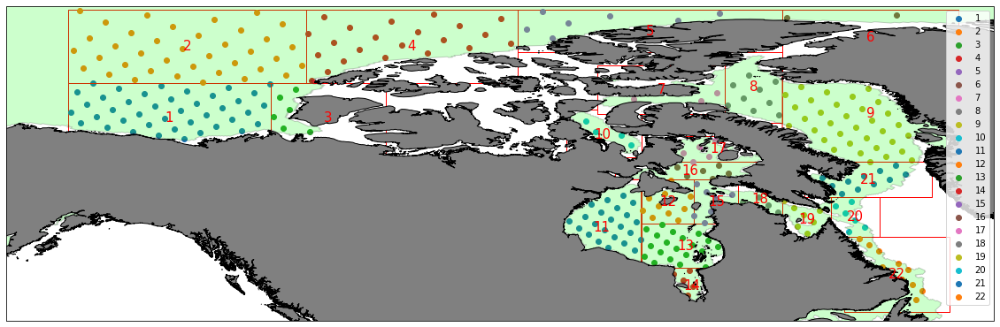

In [42]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
# ax1.set_extent((-60, -55, 49, 84), crs=ccrs.PlateCarree())
for keys in polydict:
    ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
    x=polydict[keys].centroid.x
    y=polydict[keys].centroid.y
    ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
    #getting points in polygon. from paramid.
    indparam=np.where(vec[2,:]==keys)[0]
    print(vec)
    ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
# ax1.scatter(inicelon,inicelat,transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
# fig.savefig('/u/vasulkar/p_emodnet_amey/Regional_canada_model/postprocessing/calibration/figures/2020sensitvity_'+typ+'_negit.jpg',dpi=1000)
# plt.show()

In [43]:
fname='viscosity_correction_march_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((inicelon[sortind],inicelat[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
vec[2,:]=1.0 #starting with 1.0 as the multiplier.

np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

Now we try to do similar things with fast ice cover. First step is plotting fast ice and getting the points within fast ice


In [44]:
#get the projected buff file which gives us the polygon on ice cover. 
#now depending on march and september we have different files. Also, for march we will have the friction term too.
month='march'
# prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer_proj.shp'
# buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer.shp'
buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/fast/Buffer.shp'
prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/fast/Buffer_proj.shp'
# reader=shapefile.Reader(buffile)
# multipol=shape(reader.shape())
multipol = fiona.open(buffile)
multipolprj=fiona.open(prjbuffile)
multi= multipol.next() # only one feature in the shapefile
multipol=shape(multi['geometry'])
multipol

/tmp/ipykernel_21690/2842779930.py:12: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  multi= multipol.next() # only one feature in the shapefile


In [45]:
#check if a point lies in a polygon. If so, add the point in inicelon and inicelat 
paramid=[]
inficelon=[];inficelat=[]
count=0
inProj = Proj(init='epsg:4326', preserve_units=True)
outProj = Proj(init='epsg:6931')
for i in range(len(modoceanlatpointvec))[:]:
    x2,y2 = transform(inProj,outProj,modoceanlonpointvec[i],modoceanlatpointvec[i])
    point=shape(Point(x2,y2))
    # print(point)
    if point.within(multipol.buffer(0)):
        # print(i)
        inficelon=np.append(inficelon,modoceanlonpointvec[i])
        inficelat=np.append(inficelat,modoceanlatpointvec[i])
        count+=1

/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferre

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


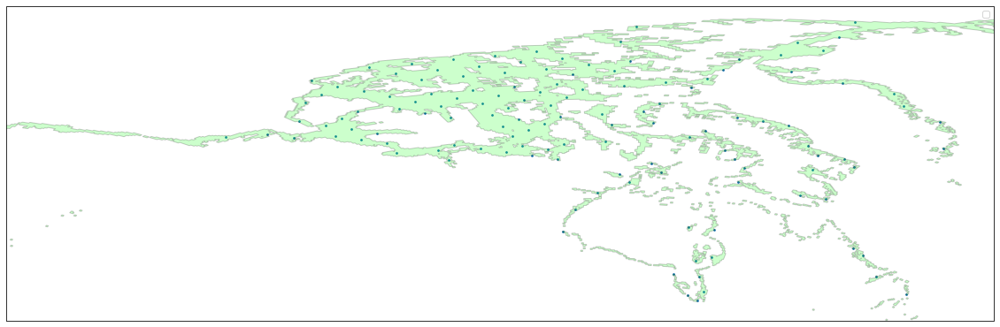

In [49]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
# ax1.set_extent((-60, -55, 49, 84), crs=ccrs.PlateCarree())
# for keys in polydict:
#     ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
#     x=polydict[keys].centroid.x
#     y=polydict[keys].centroid.y
#     ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
#     #getting points in polygon. from paramid.
#     indparam=np.where(vec[2,:]==keys)[0]
#     print(vec)
#     ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
ax1.scatter(inficelon,inficelat,transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
# feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
# ax1.add_feature(feature)
# fig.savefig('/u/vasulkar/p_emodnet_amey/Regional_canada_model/postprocessing/calibration/figures/2020sensitvity_'+typ+'_negit.jpg',dpi=1000)
# plt.show()